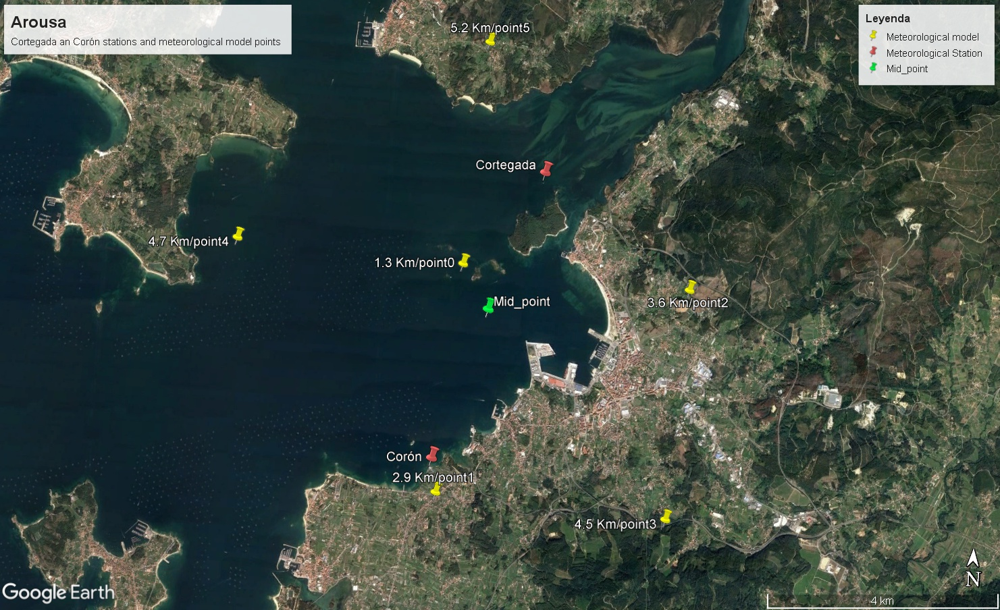

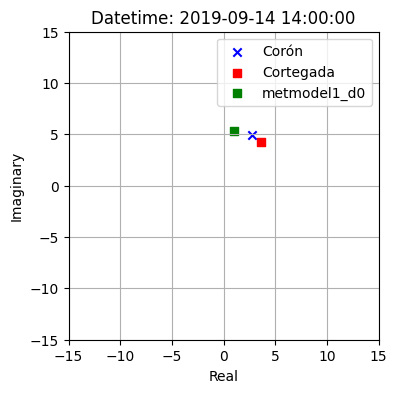

In [35]:
# @title Corón vesus Cortegada and meteorological model model point 1 forecast day 0

import pandas as pd
import math
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import datetime

# Function to convert polar coordinates (angle and modulus) to complex numbers
def polar_to_complex(angles, moduli):
    complex_numbers = []

    for angle, modulus in zip(angles, moduli):
        # Convert degrees to radians with clockwise adjustment
        angle_radians = math.radians(90 - angle)

        # Use polar to rectangular coordinates conversion
        real_part = modulus * math.cos(angle_radians)
        imag_part = modulus * math.sin(angle_radians)

        complex_numbers.append(complex(real_part, imag_part))

    return complex_numbers

# Function to update the plot for each frame of the animation
def update(frame):
    plt.cla()  # Clear the current axis

    plt.xlim(-15, 15)  # Set fixed X-axis limits
    plt.ylim(-15, 15)  # Set fixed Y-axis limits

    plt.xlabel('Real')
    plt.ylabel('Imaginary')

    # Label frames with datetime values from the datetime array
    plt.title(f'Datetime: {date_times[frame].strftime("%Y-%m-%d %H:%M:%S")}')
    plt.grid(True)
    # Plot complex numbers from all three arrays at the current frame
    plt.scatter(real1[frame], imag1[frame], c='b', marker='x', label= "Corón")
    plt.scatter(real2[frame], imag2[frame], c='r', marker='s', label='Cortegada')
    plt.scatter(real3[frame], imag3[frame], c='g', marker='s', label='metmodel1_d0')
    plt.legend()

#load files
coron = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Coron/station_data/coron.csv",
                    usecols=["time","dir_o","spd_o"],parse_dates=["time"]).set_index("time").add_suffix("_coron")
coron = coron[~coron.index.duplicated(keep='first')]
corte =  pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Coron/station_data/cortegada.csv",
                     usecols=["time","dir_o","spd_o"],parse_dates=["time"]).set_index("time").add_suffix("_corte")
corte = corte[~corte.index.duplicated(keep='first')]
metmodel_d0 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Coron/met_ model/model_vs_Cortegada_Coron/mid_point_lat42.6lon-8.794p6R4KmD0.csv",
                        usecols=["time","dir0","mod0","dir1","mod1"],parse_dates=["time"]).set_index("time").add_suffix("_d0")
metmodel_d1 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Coron/met_ model/model_vs_Cortegada_Coron/mid_point_lat42.6lon-8.794p6R4KmD1.csv",
                        usecols=["time","dir0","mod0","dir1","mod1"],parse_dates=["time"]).set_index("time").add_suffix("_d1")
df_r = pd.concat([coron,corte,metmodel_d0,metmodel_d1],axis=1).dropna().sample(100)

# input lists of angles and moduli (angles expressed from y-axis clockwise)
angles1 = df_r.dir_o_coron
moduli1 = df_r.spd_o_coron
angles2 = df_r.dir_o_corte
moduli2 = df_r.spd_o_corte
angles3 = df_r.dir1_d0
moduli3 = df_r.mod1_d0

# Convert the polar coordinates to complex numbers
complex_numbers1 = polar_to_complex(angles1, moduli1)
complex_numbers2 = polar_to_complex(angles2, moduli2)
complex_numbers3 = polar_to_complex(angles3, moduli3)

# Generate a time axis
time = df_r.index
num_frames = len(time)

# Extract real and imaginary parts for all arrays
real1 = np.real(complex_numbers1)
imag1 = np.imag(complex_numbers1)
real2 = np.real(complex_numbers2)
imag2 = np.imag(complex_numbers2)
real3 = np.real(complex_numbers3)
imag3 = np.imag(complex_numbers3)
date_times = df_r.index

# Create a figure and initiate the animation (start from frame 0)
fig, ax = plt.subplots(figsize=(4, 4))
ani = FuncAnimation(fig, update, frames=range(0, num_frames), repeat=True)



# Display the animation in Colab
HTML(ani.to_jshtml())



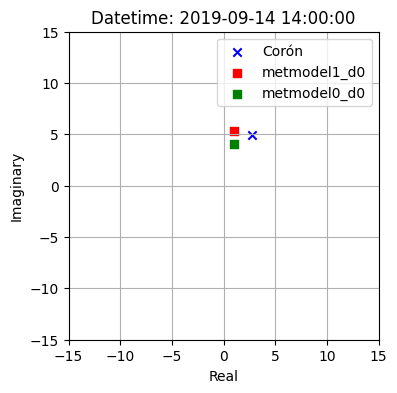

In [36]:
# @title Corón vesus meteorological model model point 0 and point 1 forecast day 0
# Function to update the plot for each frame of the animation
def update(frame):
    plt.cla()  # Clear the current axis

    plt.xlim(-15, 15)  # Set fixed X-axis limits
    plt.ylim(-15, 15)  # Set fixed Y-axis limits

    plt.xlabel('Real')
    plt.ylabel('Imaginary')

    # Label frames with datetime values from the datetime array
    plt.title(f'Datetime: {date_times[frame].strftime("%Y-%m-%d %H:%M:%S")}')
    plt.grid(True)
    # Plot complex numbers from all three arrays at the current frame
    plt.scatter(real1[frame], imag1[frame], c='b', marker='x', label= "Corón")
    plt.scatter(real2[frame], imag2[frame], c='r', marker='s', label='metmodel1_d0')
    plt.scatter(real3[frame], imag3[frame], c='g', marker='s', label='metmodel0_d0')
    plt.legend()

# input lists of angles and moduli (angles expressed from y-axis clockwise)
angles1 = df_r.dir_o_coron
moduli1 = df_r.spd_o_coron
angles2 = df_r.dir1_d0
moduli2 = df_r.mod1_d0
angles3 = df_r.dir0_d0
moduli3 = df_r.mod0_d0

# Convert the polar coordinates to complex numbers
complex_numbers1 = polar_to_complex(angles1, moduli1)
complex_numbers2 = polar_to_complex(angles2, moduli2)
complex_numbers3 = polar_to_complex(angles3, moduli3)

# Generate a time axis
time = df_r.index
num_frames = len(time)

# Extract real and imaginary parts for all arrays
real1 = np.real(complex_numbers1)
imag1 = np.imag(complex_numbers1)
real2 = np.real(complex_numbers2)
imag2 = np.imag(complex_numbers2)
real3 = np.real(complex_numbers3)
imag3 = np.imag(complex_numbers3)
date_times = df_r.index

# Create a figure and initiate the animation (start from frame 0)
fig, ax = plt.subplots(figsize=(4, 4))
ani = FuncAnimation(fig, update, frames=range(0, num_frames), repeat=False)



# Display the animation in Colab
HTML(ani.to_jshtml())


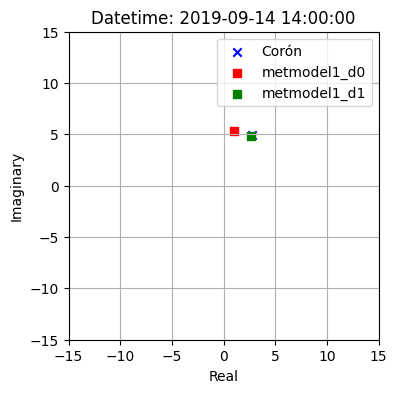

In [37]:
# @title Corón vesus meteorological model model point 1 forecast day 0 and day 1
# Function to update the plot for each frame of the animation
def update(frame):
    plt.cla()  # Clear the current axis

    plt.xlim(-15, 15)  # Set fixed X-axis limits
    plt.ylim(-15, 15)  # Set fixed Y-axis limits

    plt.xlabel('Real')
    plt.ylabel('Imaginary')

    # Label frames with datetime values from the datetime array
    plt.title(f'Datetime: {date_times[frame].strftime("%Y-%m-%d %H:%M:%S")}')
    plt.grid(True)
    # Plot complex numbers from all three arrays at the current frame
    plt.scatter(real1[frame], imag1[frame], c='b', marker='x', label= "Corón")
    plt.scatter(real2[frame], imag2[frame], c='r', marker='s', label='metmodel1_d0')
    plt.scatter(real3[frame], imag3[frame], c='g', marker='s', label='metmodel1_d1')
    plt.legend()

# input lists of angles and moduli (angles expressed from y-axis clockwise)
angles1 = df_r.dir_o_coron
moduli1 = df_r.spd_o_coron
angles2 = df_r.dir1_d0
moduli2 = df_r.mod1_d0
angles3 = df_r.dir1_d1
moduli3 = df_r.mod1_d1

# Convert the polar coordinates to complex numbers
complex_numbers1 = polar_to_complex(angles1, moduli1)
complex_numbers2 = polar_to_complex(angles2, moduli2)
complex_numbers3 = polar_to_complex(angles3, moduli3)

# Generate a time axis
time = df_r.index
num_frames = len(time)

# Extract real and imaginary parts for all arrays
real1 = np.real(complex_numbers1)
imag1 = np.imag(complex_numbers1)
real2 = np.real(complex_numbers2)
imag2 = np.imag(complex_numbers2)
real3 = np.real(complex_numbers3)
imag3 = np.imag(complex_numbers3)
date_times = df_r.index

# Create a figure and initiate the animation (start from frame 0)
fig, ax = plt.subplots(figsize=(4, 4))
ani = FuncAnimation(fig, update, frames=range(0, num_frames), repeat=False)



# Display the animation in Colab
HTML(ani.to_jshtml())